<a href="https://colab.research.google.com/github/satishsalyal/neuralnetwork/blob/master/Intestinalis_Parasites_Detection_using_YOLOv5s%26l.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Train YOLOv5 Methods on Parasites Datassets


### Steps implimented in this Experiment



To train YOLOv5 methods we take the following steps:


1.   Download custom YOLOv5 object detection dataset
2.   Install YOLOv5 dependencies
3.   Run YOLOv5 training
4.   Evaluate YOLOv5 performance
5.   Visualize YOLOv5 training data
6.   Run YOLOv5 inference on test images
7.   Export saved YOLOv5 weights for future inferences



###  Download  YOLOv5 Intestinal parsites detection dataset

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


####      UNZIPPING THE DATASET

In [2]:
!unzip -q  /content/drive/MyDrive/datasetPS.zip

###  CLONING THE **YOLO-V5** FILES FROM OFFICIAL **REPOSITORY**

In [3]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 14906, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 14906 (delta 11), reused 12 (delta 2), pack-reused 14880
Receiving objects: 100% (14906/14906), 13.92 MiB | 24.88 MiB/s, done.
Resolving deltas: 100% (10258/10258), done.


### CHANGING THE DIRECTORY



In [5]:
%cd yolov5

[Errno 2] No such file or directory: 'yolov5'
/content/yolov5


### INSTALLING THE DEPENDENCIES

In [6]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 182 kB 14.6 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
     |████████████████████████████████| 1.6 MB 58.3 MB/s 


### DOWNLOADING ALL VERSIONS OF YOLO-V5 MODEL


In [8]:
#!/content/yolov5/weights/download_weights.sh   
!python detect.py --weights yolov5l.pt 

detect: weights=['yolov5l.pt'], source=data/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

100% 89.3M/89.3M [00:02<00:00, 38.0MB/s]

Fusing layers... 
YOLOv5l summary: 367 layers, 46533693 parameters, 0 gradients
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, 40.7ms
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 1 tie, 36.1ms
Speed: 0.5ms pre-process, 38.4ms inference, 19.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


### STEPS BEFORE TRAINING CUSTOM DATASET:
  1. Go to yolov5/data/
  2. Open coco128.yaml
Edit the following inside it:

 -Training and Test file path
 
 -Number of classes and Class names.

### TRAINING THE YOLO-V5 MODEL

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [14]:

!python train.py --img 416 --batch 8 --epochs 100 --data coco128.yaml --weights yolov5l.pt --nosave --cache 

train: weights=yolov5l.pt, cfg=, data=coco128.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=8, imgsz=416, rect=False, resume=False, nosave=True, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, de

### Evaluate Custom YOLOv5 Detector Performance

In [16]:
%load_ext tensorboard
%tensorboard --logdir runs/train

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 16538), started 1:33:38 ago. (Use '!kill 16538' to kill it.)

<IPython.core.display.Javascript object>

In [17]:
from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

GROUND TRUTH TRAINING DATA:


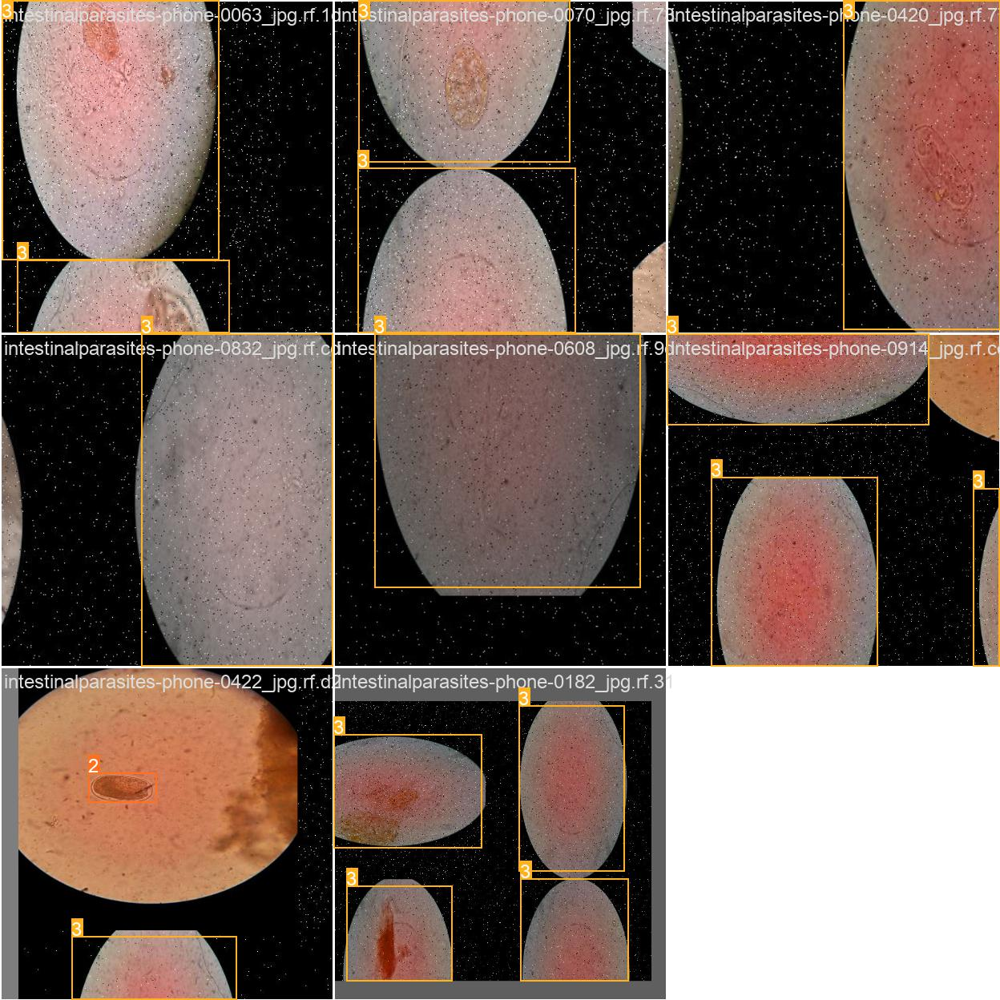

In [19]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/exp2/train_batch0.jpg', width=900)

In [20]:
!python val.py --weights /content/yolov5/runs/train/exp2/weights/last.pt  --data coco128.yaml --img 416 

val: data=/content/yolov5/data/coco128.yaml, weights=['/content/yolov5/runs/train/exp2/weights/last.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 267 layers, 46124433 parameters, 0 gradients, 107.7 GFLOPs
val: Scanning /content/valid/labels.cache... 198 images, 0 backgrounds, 0 corrupt: 100% 198/198 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 7/7 [00:04<00:00,  1.46it/s]
                   all        198        201      0.938      0.972      0.969      0.722
                Taenia        198          2      0.952          1      0.995      0.746
              

Validation Label DATA:


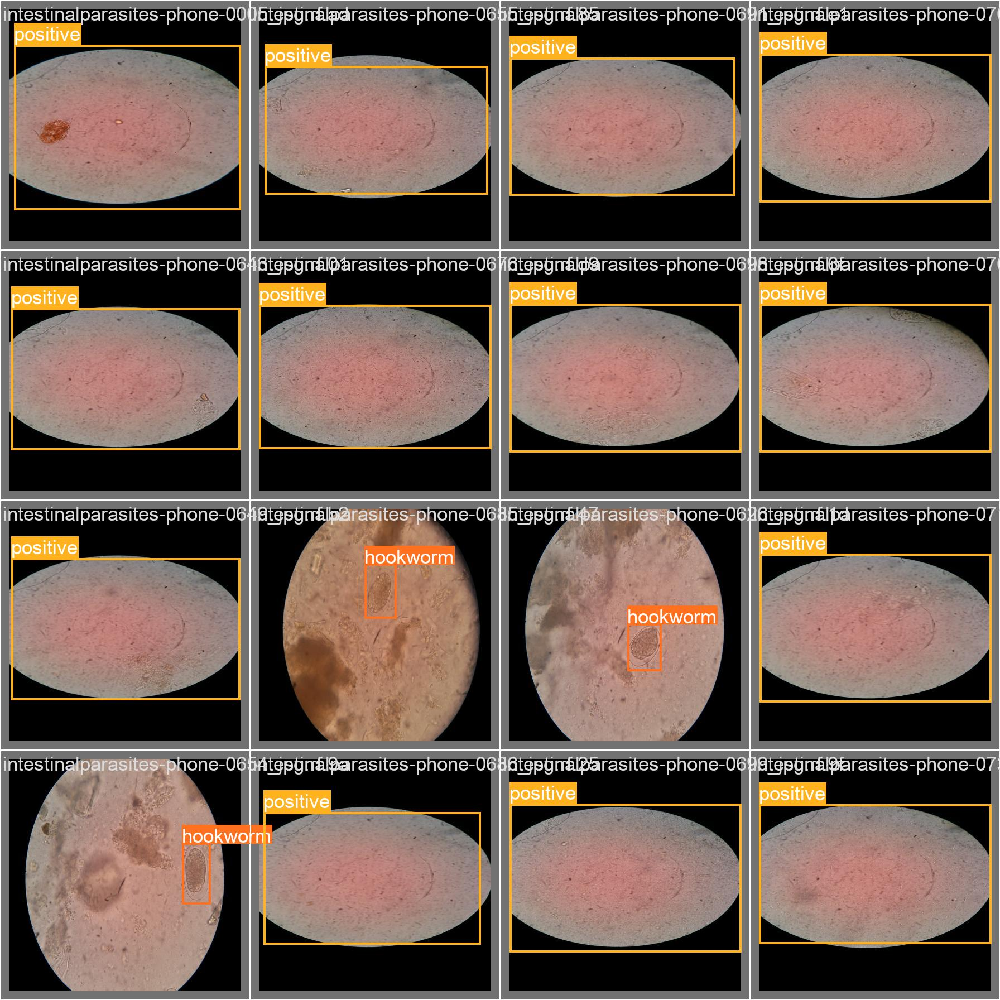

In [21]:
print("Validation Label DATA:")
Image(filename='/content/yolov5/runs/val/exp2/val_batch0_labels.jpg', width=900)

Validation Prediction DATA:


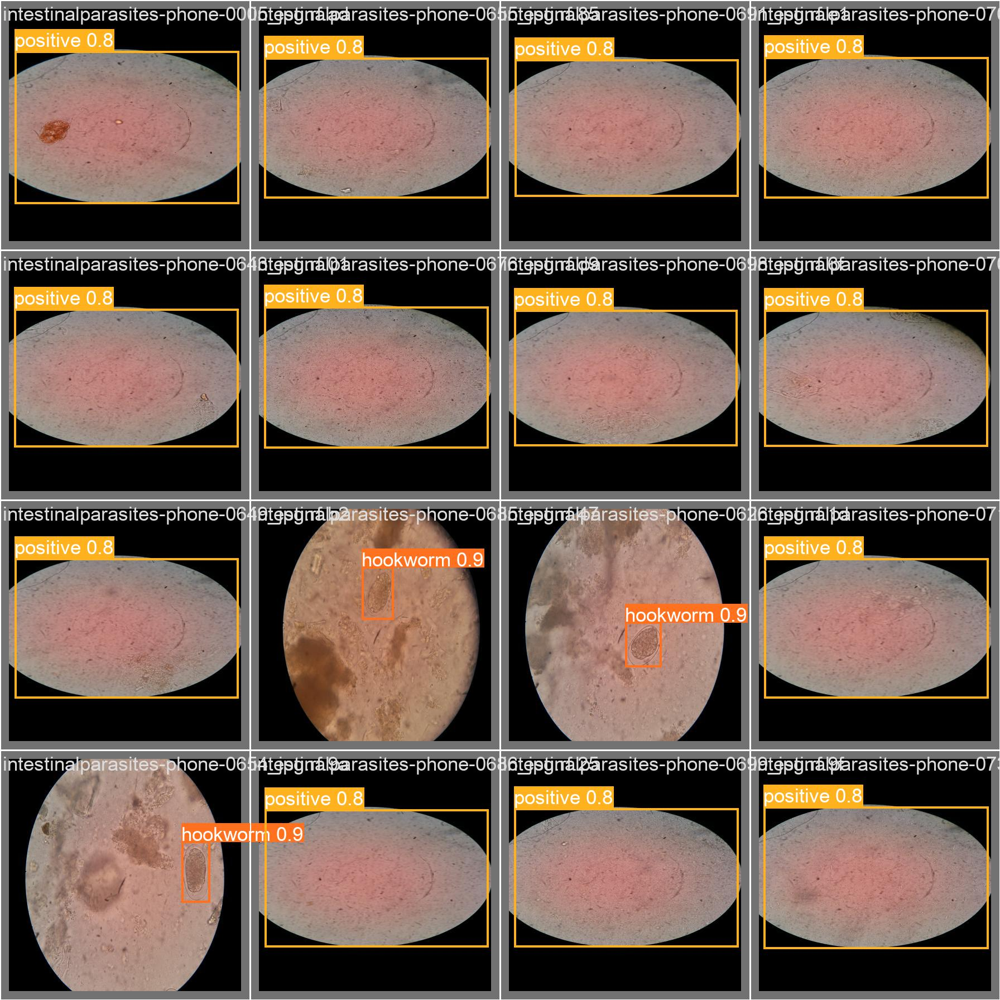

In [22]:
print("Validation Prediction DATA:")
Image(filename='/content/yolov5/runs/val/exp2/val_batch0_pred.jpg', width=900)

In [23]:
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/exp2/weights/last.pt --img 416 --conf 0.4 --source ../test/images

/content/yolov5
detect: weights=['/content/yolov5/runs/train/exp2/weights/last.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 267 layers, 46124433 parameters, 0 gradients, 107.7 GFLOPs
image 1/104 /content/test/images/intestinalparasites-phone-0002_jpg.rf.cc3ac3c90298940f443f29e873f2d975.jpg: 416x416 1 positive, 30.3ms
image 2/104 /content/test/images/intestinalparasites-phone-0006_jpg.rf.87f9216f8b412c9e5c024904de6ae237.jpg: 416x416 1 positive, 30.3ms
image 3/104 /content/test/images/intestinalpar

In [25]:
print("Testing DATA:")
Image(filename='/content/yolov5/runs/detect/exp2/val_batch0_pred.jpg', width=900)

Testing DATA:


FileNotFoundError: ignored

## DETECTING ON NEW IMAGES

In [ ]:
!python detect.py --source /content/drive/MyDrive/1000_F_166340642_nH7haAGhpnCxDeVZJMThFhE3cdMv5Ihi.jpg --weights /content/yolov5/runs/train/exp2/weights/last.pt --img 416 --save-txt --save-conf

detect: weights=['/content/yolov5/runs/train/exp2/weights/last.pt'], source=/content/drive/MyDrive/1000_F_166340642_nH7haAGhpnCxDeVZJMThFhE3cdMv5Ihi.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-49-g3c1afd9 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Traceback (most recent call last):
  File "detect.py", line 261, in <module>
    main(opt)
  File "detect.py", line 256, in main
    run(**vars(opt))
  File "/usr/local/lib/python3.8/dist-packages/torch/autograd/grad_mode.py", line 27, in decorate_context
    return func(*args, **kwargs)
  File "detect.py", line 98, in run
    model = DetectMultiBackend(weights, 

### RETRAINING FROM THE LAST CHECKPOINT

In [ ]:
!python train.py --weights /content/yolov5/runs/train/exp2/weights/last.pt --epochs 100 --img 416

### Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [26]:
%cp -r /content/yolov5/runs/train/exp /content/drive/MyDrive

In [27]:
!zip -r /content/yolov5.zip /content/yolov5

  adding: content/yolov5/ (stored 0%)
  adding: content/yolov5/train.py (deflated 69%)
  adding: content/yolov5/CITATION.cff (deflated 31%)
  adding: content/yolov5/README.zh-CN.md (deflated 77%)
  adding: content/yolov5/.gitignore (deflated 55%)
  adding: content/yolov5/benchmarks.py (deflated 68%)
  adding: content/yolov5/tutorial.ipynb (deflated 78%)
  adding: content/yolov5/runs/ (stored 0%)
  adding: content/yolov5/runs/val/ (stored 0%)
  adding: content/yolov5/runs/val/exp2/ (stored 0%)
  adding: content/yolov5/runs/val/exp2/F1_curve.png (deflated 11%)
  adding: content/yolov5/runs/val/exp2/R_curve.png (deflated 14%)
  adding: content/yolov5/runs/val/exp2/val_batch1_labels.jpg (deflated 22%)
  adding: content/yolov5/runs/val/exp2/P_curve.png (deflated 13%)
  adding: content/yolov5/runs/val/exp2/val_batch0_pred.jpg (deflated 20%)
  adding: content/yolov5/runs/val/exp2/confusion_matrix.png (deflated 28%)
  adding: content/yolov5/runs/val/exp2/val_batch0_labels.jpg (deflated 21%)
  

In [28]:
from google.colab import files
files.download('/content/yolov5.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

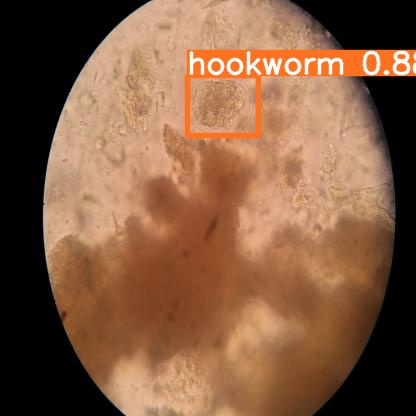

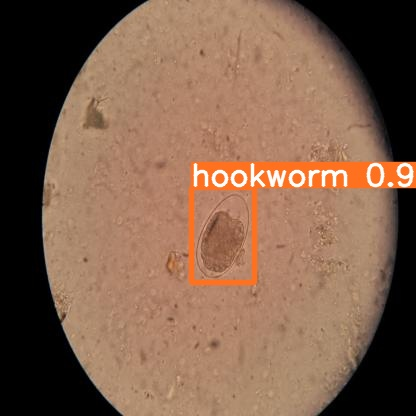

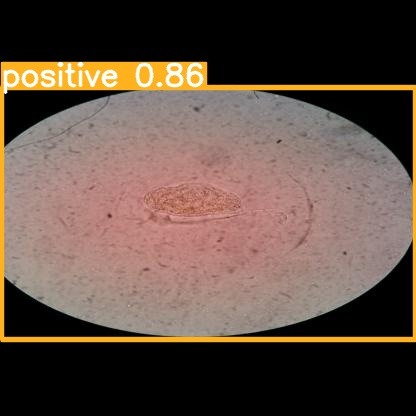

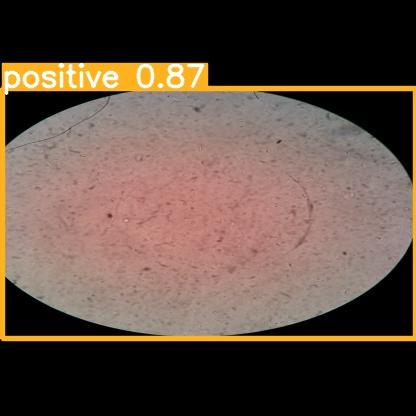

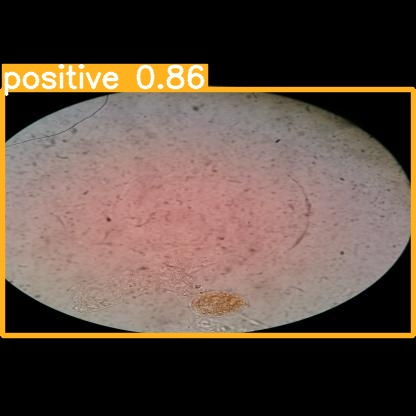

...

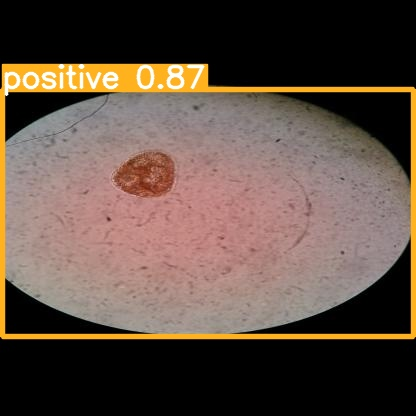

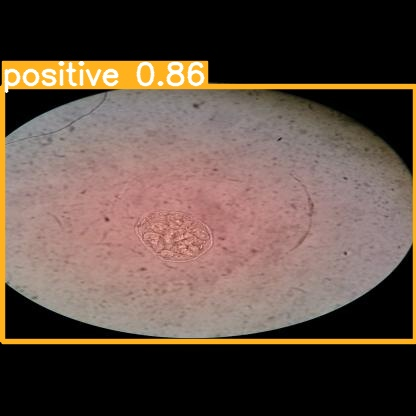

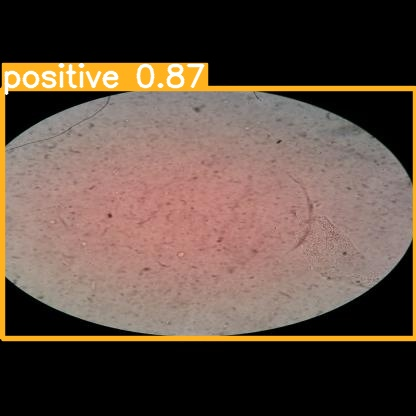

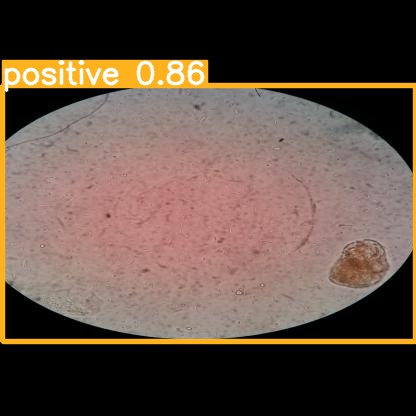

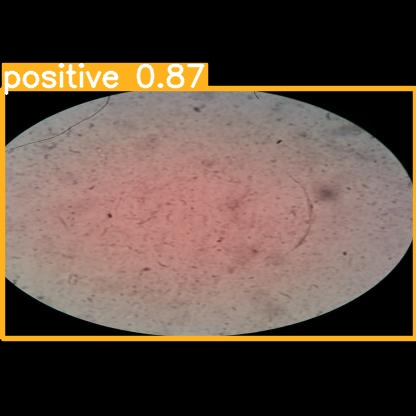

In [29]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

### Congrats!
Hope you enjoyed this!